In [1]:
#Basic libraries
import warnings
import tensorflow as ts
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
from collections import Counter
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')
from imblearn.over_sampling import RandomOverSampler

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,roc_auc_score, precision_score,recall_score,f1_score

In [3]:
# Load the diabetes dataset
dataset= pd.read_csv('D:/PhD/Data Science/final_dataset.csv', sep = ',', index_col = 'id')

In [4]:
# Assume that 'Diabetes_012' is the target variable
X = dataset.drop('diabetes', axis=1)
y = dataset['diabetes']

In [5]:
from sklearn.model_selection import StratifiedShuffleSplit
# Initialize the StratifiedShuffleSplit
stratified_splitter = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
# Iterate over the splits
for train_index, test_index in stratified_splitter.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [6]:
from lightgbm import LGBMClassifier

In [7]:
# Train a LightGBM classifier
lgb_model = LGBMClassifier(random_state=42)
lgb_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 61
[LightGBM] [Info] Number of data points in the train set: 182243, number of used features: 20
[LightGBM] [Info] Start training from score -0.190753
[LightGBM] [Info] Start training from score -3.902700
[LightGBM] [Info] Start training from score -1.874208


LGBMClassifier(random_state=42)

In [8]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, lgb_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.8333223590351397


In [9]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [10]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, lgb_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.827966901516648
Accuracy with remaining features after LOCO for HighChol: 0.8301398125589868
Accuracy with remaining features after LOCO for CholCheck: 0.8290423827396238
Accuracy with remaining features after LOCO for BMI: 0.8268255745045104
Accuracy with remaining features after LOCO for Smoker: 0.8328833871073945
Accuracy with remaining features after LOCO for Stroke: 0.8330809244748798
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.8327516955290709
Accuracy with remaining features after LOCO for PhysActivity: 0.8328833871073945
Accuracy with remaining features after LOCO for Fruits: 0.8328175413182327
Accuracy with remaining features after LOCO for Veggies: 0.8331906674568161
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.833015078685718
Accuracy with remaining features after LOCO for AnyHealthcare: 0.8323566207941002
Accuracy with remaining features after LOCO for NoDocbcCost: 

In [11]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = 0.0053554575184917574
HighChol: Impact = 0.003182546476152903
CholCheck: Impact = 0.004279976295515908
BMI: Impact = 0.006496784530629296
Smoker: Impact = 0.0004389719277452242
Stroke: Impact = 0.00024143456025993437
HeartDiseaseorAttack: Impact = 0.0005706635060688248
PhysActivity: Impact = 0.0004389719277452242
Fruits: Impact = 0.0005048177169070245
Veggies: Impact = 0.00013169157832360057
HvyAlcoholConsump: Impact = 0.00030728034942173466
AnyHealthcare: Impact = 0.0009657382410395154
NoDocbcCost: Impact = -4.389719277453352e-05
health_issue: Impact = 0.0004389719277452242
GenHlth: Impact = 0.002941111915892969
DiffWalk: Impact = 0.0004389719277452242
Sex: Impact = 0.00046092052413249096
Age: Impact = 0.005706635060687915
Education: Impact = 0.003380083843638193
Income: Impact = 0.0015364017471083402


In [12]:
# Scenario 2: Removal-Based Explanations

In [13]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, lgb_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.827966901516648
Accuracy with remaining features after Removal for HighChol: 0.8301398125589868
Accuracy with remaining features after Removal for CholCheck: 0.8290423827396238
Accuracy with remaining features after Removal for BMI: 0.8268255745045104
Accuracy with remaining features after Removal for Smoker: 0.8328833871073945
Accuracy with remaining features after Removal for Stroke: 0.8330809244748798
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.8327516955290709
Accuracy with remaining features after Removal for PhysActivity: 0.8328833871073945
Accuracy with remaining features after Removal for Fruits: 0.8328175413182327
Accuracy with remaining features after Removal for Veggies: 0.8331906674568161
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.833015078685718
Accuracy with remaining features after Removal for AnyHealthcare: 0.8323566207941002
Accuracy with remaining f

In [14]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = 0.0053554575184917574
HighChol: Impact = 0.003182546476152903
CholCheck: Impact = 0.004279976295515908
BMI: Impact = 0.006496784530629296
Smoker: Impact = 0.0004389719277452242
Stroke: Impact = 0.00024143456025993437
HeartDiseaseorAttack: Impact = 0.0005706635060688248
PhysActivity: Impact = 0.0004389719277452242
Fruits: Impact = 0.0005048177169070245
Veggies: Impact = 0.00013169157832360057
HvyAlcoholConsump: Impact = 0.00030728034942173466
AnyHealthcare: Impact = 0.0009657382410395154
NoDocbcCost: Impact = -4.389719277453352e-05
health_issue: Impact = 0.0004389719277452242
GenHlth: Impact = 0.002941111915892969
DiffWalk: Impact = 0.0004389719277452242
Sex: Impact = 0.00046092052413249096
Age: Impact = 0.005706635060687915
Education: Impact = 0.003380083843638193
Income: Impact = 0.0015364017471083402


In [15]:
print("Accuracy Score:", round(accuracy_score(y_test, lgb_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, lgb_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 83.33
precision score: 78.56
recall score: 83.33
Roc curve: 79.55
f1 score: 79.13


# permutation_importance

In [16]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(lgb_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
3                    BMI    0.006889
14               GenHlth    0.006828
0                 HighBP    0.004033
1               HighChol    0.003155
17                   Age    0.002115
15              DiffWalk    0.000734
16                   Sex    0.000704
6   HeartDiseaseorAttack    0.000637
19                Income    0.000629
10     HvyAlcoholConsump    0.000551
5                 Stroke    0.000289
4                 Smoker    0.000241
13          health_issue    0.000233
2              CholCheck    0.000155
7           PhysActivity    0.000137
9                Veggies    0.000022
12           NoDocbcCost    0.000019
11         AnyHealthcare   -0.000029
8                 Fruits   -0.000119
18             Education   -0.000143


# SHAP

In [17]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = lgb_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

In [18]:
#We will use below rows for prediction explanations using lime and shap
row = [100, 150,200, 250,300]

for row : 100  the real value is  0


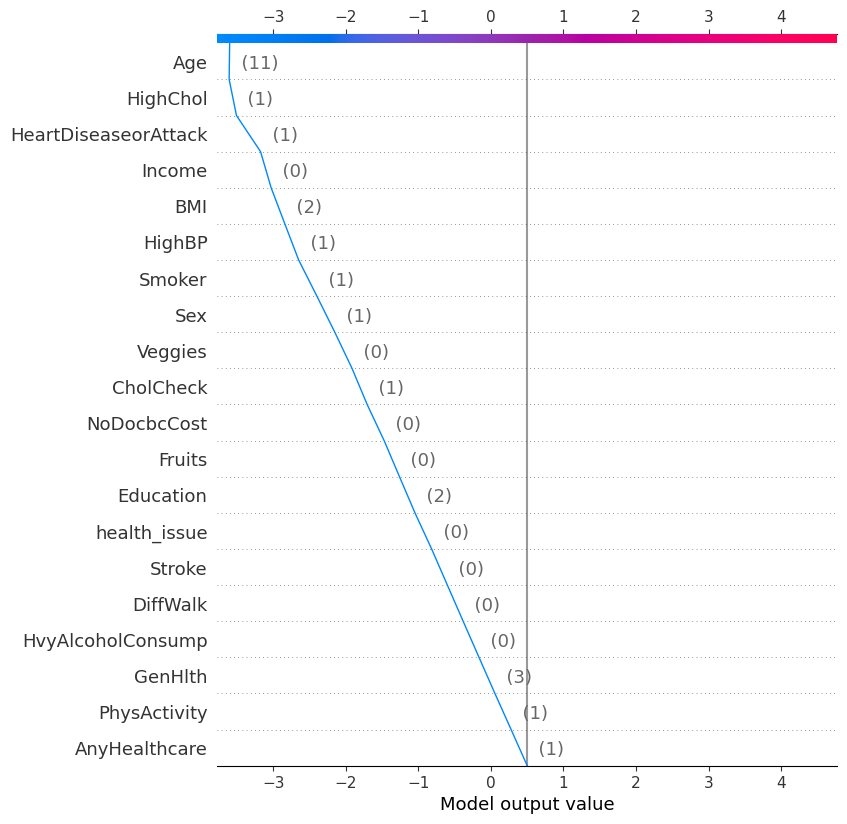

for row : 150  the real value is  0


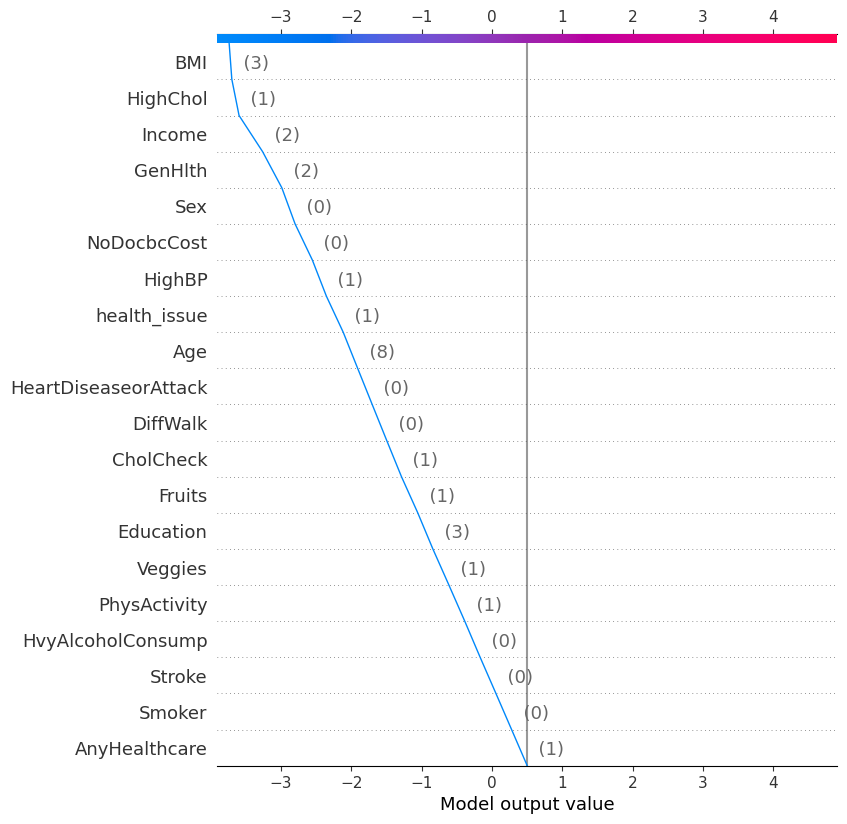

for row : 200  the real value is  0


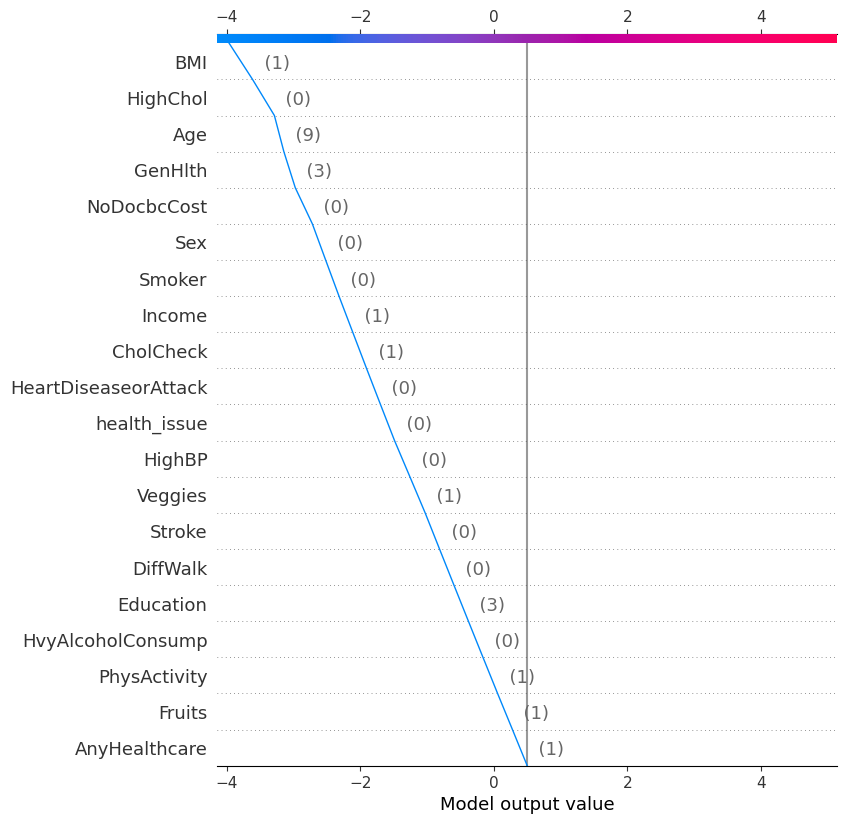

for row : 250  the real value is  0


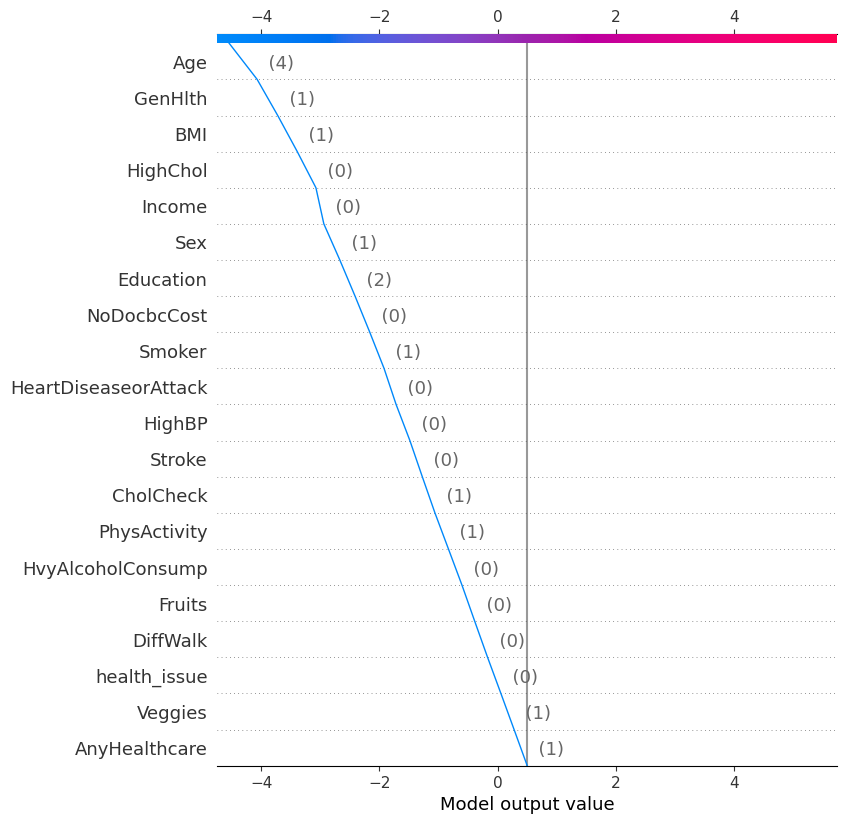

for row : 300  the real value is  2


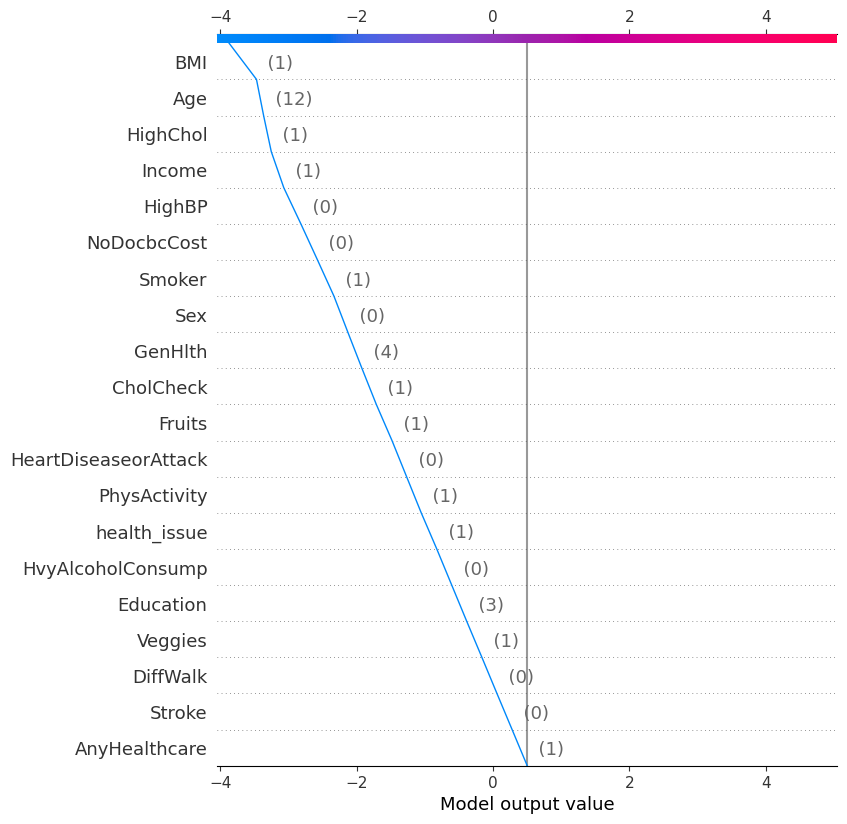

In [19]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

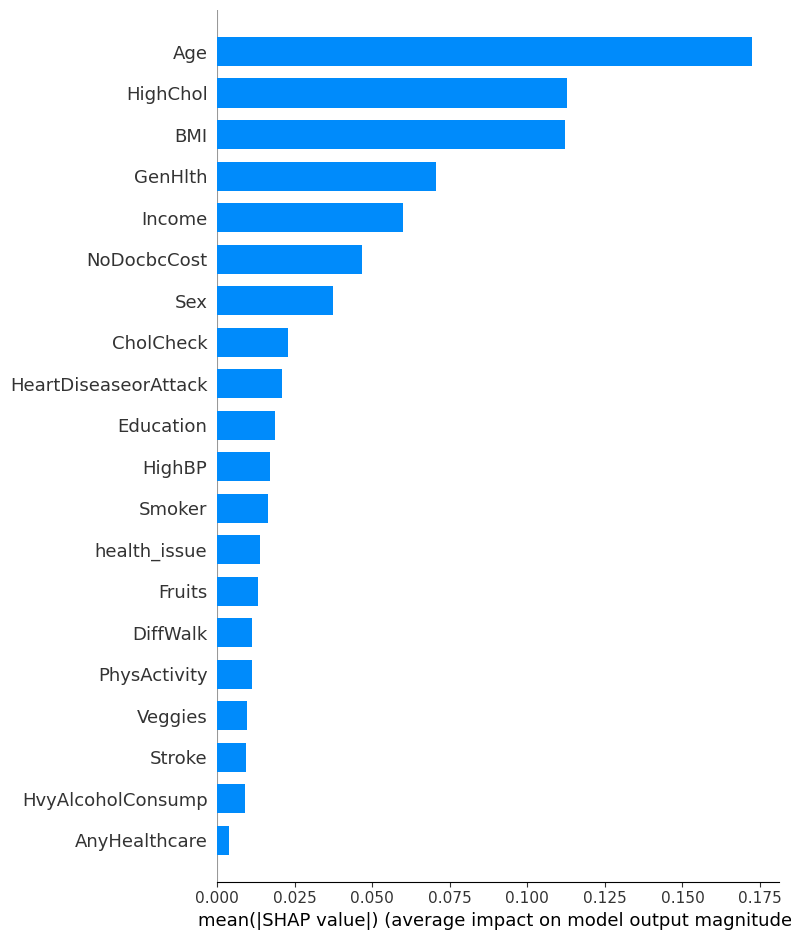

In [20]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [21]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

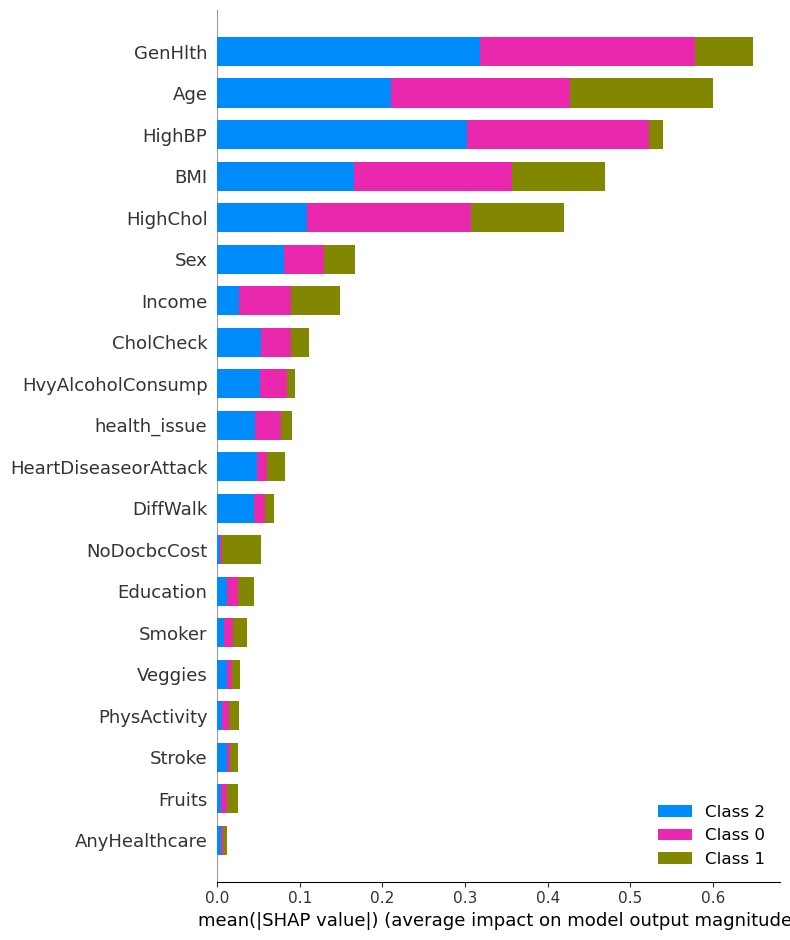

In [22]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# LIME

In [23]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],

)

In [24]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], lgb_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2


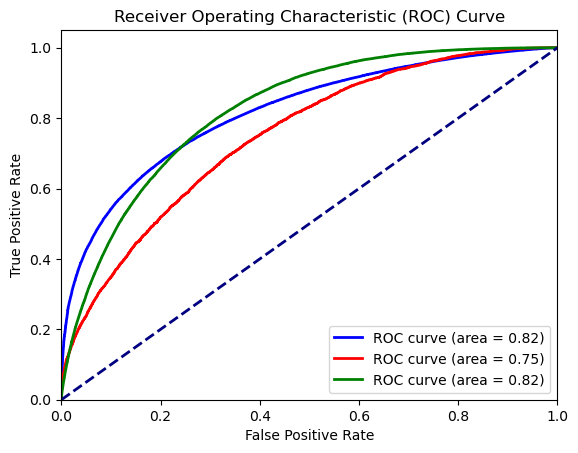

In [25]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Assuming lgb_model is your model and X, y are your data and labels
# Assuming y has three classes (0, 1, and 2)

# Binarize the labels
y_bin = label_binarize(y, classes=[0, 1, 2])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], lgb_model.predict_proba(X)[:, i])
    roc_auc[i] = roc_auc_score(y_bin[:, i], lgb_model.predict_proba(X)[:, i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [26]:
from imblearn.combine import SMOTETomek
Resample= SMOTETomek(sampling_strategy='not minority',random_state=10)
X_train,y_train=Resample.fit_resample(X_train,y_train)

In [27]:
# Train a LightGBM classifier
lgb_model = LGBMClassifier(random_state=42)
lgb_model.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 61
[LightGBM] [Info] Number of data points in the train set: 302687, number of used features: 20
[LightGBM] [Info] Start training from score -0.705082
[LightGBM] [Info] Start training from score -4.492459
[LightGBM] [Info] Start training from score -0.703725


LGBMClassifier(random_state=42)

In [28]:
# Evaluate the model on the original test set
original_accuracy = accuracy_score(y_test, lgb_model.predict(X_test))
print("Original Accuracy:", original_accuracy)

Original Accuracy: 0.691336889005948


In [29]:
# Scenario 1: Leave-One-Column-Out (LOCO)

In [30]:
loco_accuracy = {}
for feature in X.columns:
    X_test_loco = X_test.copy()
    X_test_loco[feature] = np.nan
    loco_accuracy[feature] = accuracy_score(y_test, lgb_model.predict(X_test_loco))
    print(f"Accuracy with remaining features after LOCO for {feature}: {loco_accuracy[feature]}")

Accuracy with remaining features after LOCO for HighBP: 0.7467790434801694
Accuracy with remaining features after LOCO for HighChol: 0.7218673865806282
Accuracy with remaining features after LOCO for CholCheck: 0.7953732358815654
Accuracy with remaining features after LOCO for BMI: 0.8040648800509207
Accuracy with remaining features after LOCO for Smoker: 0.6785847545049494
Accuracy with remaining features after LOCO for Stroke: 0.6882640855117316
Accuracy with remaining features after LOCO for HeartDiseaseorAttack: 0.6916880665481443
Accuracy with remaining features after LOCO for PhysActivity: 0.6749851846974386
Accuracy with remaining features after LOCO for Fruits: 0.67761901626391
Accuracy with remaining features after LOCO for Veggies: 0.6855644081560984
Accuracy with remaining features after LOCO for HvyAlcoholConsump: 0.6799236188845723
Accuracy with remaining features after LOCO for AnyHealthcare: 0.6932025196988653
Accuracy with remaining features after LOCO for NoDocbcCost: 

In [31]:
# Display LOCO accuracies
print("\nLOCO Accuracies:")
for feature, accuracy in loco_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


LOCO Accuracies:
HighBP: Impact = -0.055442154474221406
HighChol: Impact = -0.030530497574680182
CholCheck: Impact = -0.10403634687561736
BMI: Impact = -0.11272799104497266
Smoker: Impact = 0.012752134500998658
Stroke: Impact = 0.0030728034942164584
HeartDiseaseorAttack: Impact = -0.0003511775421962682
PhysActivity: Impact = 0.016351704308509407
Fruits: Impact = 0.013717872742038062
Veggies: Impact = 0.005772480849849604
HvyAlcoholConsump: Impact = 0.011413270121375718
AnyHealthcare: Impact = -0.0018656306929172306
NoDocbcCost: Impact = 0.006782116283663653
health_issue: Impact = 0.01834902657975024
GenHlth: Impact = -0.11154276684006059
DiffWalk: Impact = 0.00010974298193622278
Sex: Impact = -0.01600052676631336
Age: Impact = -0.13149404095608086
Education: Impact = 0.018041746230328504
Income: Impact = 0.06257544830008122


In [32]:
# Scenario 2: Removal-Based Explanations

In [33]:
removal_accuracy = {}
for feature in X.columns:
    X_test_removed = X_test.copy()
    X_test_removed[feature] = 0
    removal_accuracy[feature] = accuracy_score(y_test, lgb_model.predict(X_test_removed))
    print(f"Accuracy with remaining features after Removal for {feature}: {removal_accuracy[feature]}")

Accuracy with remaining features after Removal for HighBP: 0.7467790434801694
Accuracy with remaining features after Removal for HighChol: 0.7218673865806282
Accuracy with remaining features after Removal for CholCheck: 0.7953732358815654
Accuracy with remaining features after Removal for BMI: 0.8040648800509207
Accuracy with remaining features after Removal for Smoker: 0.6785847545049494
Accuracy with remaining features after Removal for Stroke: 0.6882640855117316
Accuracy with remaining features after Removal for HeartDiseaseorAttack: 0.6916880665481443
Accuracy with remaining features after Removal for PhysActivity: 0.6749851846974386
Accuracy with remaining features after Removal for Fruits: 0.67761901626391
Accuracy with remaining features after Removal for Veggies: 0.6855644081560984
Accuracy with remaining features after Removal for HvyAlcoholConsump: 0.6799236188845723
Accuracy with remaining features after Removal for AnyHealthcare: 0.6932025196988653
Accuracy with remaining f

In [34]:
# Display Removal-Based Explanations accuracies
print("\nRemoval-Based Explanations Accuracies:")
for feature, accuracy in removal_accuracy.items():
    impact = original_accuracy - accuracy
    print(f"{feature}: Impact = {impact}")


Removal-Based Explanations Accuracies:
HighBP: Impact = -0.055442154474221406
HighChol: Impact = -0.030530497574680182
CholCheck: Impact = -0.10403634687561736
BMI: Impact = -0.11272799104497266
Smoker: Impact = 0.012752134500998658
Stroke: Impact = 0.0030728034942164584
HeartDiseaseorAttack: Impact = -0.0003511775421962682
PhysActivity: Impact = 0.016351704308509407
Fruits: Impact = 0.013717872742038062
Veggies: Impact = 0.005772480849849604
HvyAlcoholConsump: Impact = 0.011413270121375718
AnyHealthcare: Impact = -0.0018656306929172306
NoDocbcCost: Impact = 0.006782116283663653
health_issue: Impact = 0.01834902657975024
GenHlth: Impact = -0.11154276684006059
DiffWalk: Impact = 0.00010974298193622278
Sex: Impact = -0.01600052676631336
Age: Impact = -0.13149404095608086
Education: Impact = 0.018041746230328504
Income: Impact = 0.06257544830008122


In [35]:
print("Accuracy Score:", round(accuracy_score(y_test, lgb_model.predict(X_test)) * 100, 2))
print("precision score:", round(precision_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("recall score:", round(recall_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted') * 100, 2))
print("Roc curve:",roc_auc_score(y, lgb_model.predict_proba(X), multi_class='ovr').round(4)*100)
import sklearn.metrics as metrics
print("f1 score:", metrics.f1_score(y_test, lgb_model.predict(X_test), pos_label='positive', average='weighted').round(4) * 100)

Accuracy Score: 69.13
precision score: 81.73
recall score: 69.13
Roc curve: 77.86999999999999
f1 score: 72.43


In [36]:
from sklearn.inspection import permutation_importance
# Calculate permutation importance
perm_importance = permutation_importance(lgb_model, X_test, y_test, n_repeats=30, random_state=42)
# Get the permutation importance scores
perm_importance_scores = perm_importance.importances_mean
# Create a DataFrame to display feature names and their importance scores
perm_importance_df = pd.DataFrame({'Feature': X_test.columns, 'Importance': perm_importance_scores})
# Sort the DataFrame by importance scores in descending order
perm_importance_df = perm_importance_df.sort_values(by='Importance', ascending=False)
# Display the permutation importance results
print("\nPermutation Importance:")
print(perm_importance_df)


Permutation Importance:
                 Feature  Importance
14               GenHlth    0.017336
3                    BMI    0.008968
17                   Age    0.006507
1               HighChol    0.002644
10     HvyAlcoholConsump    0.002263
4                 Smoker    0.001525
8                 Fruits    0.000386
7           PhysActivity    0.000318
9                Veggies    0.000260
16                   Sex   -0.000078
0                 HighBP   -0.000310
6   HeartDiseaseorAttack   -0.000354
5                 Stroke   -0.000366
11         AnyHealthcare   -0.000435
2              CholCheck   -0.000910
15              DiffWalk   -0.001583
12           NoDocbcCost   -0.002060
18             Education   -0.002289
19                Income   -0.002373
13          health_issue   -0.003969


# SHAP

In [37]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = lgb_model, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

for row : 100  the real value is  0


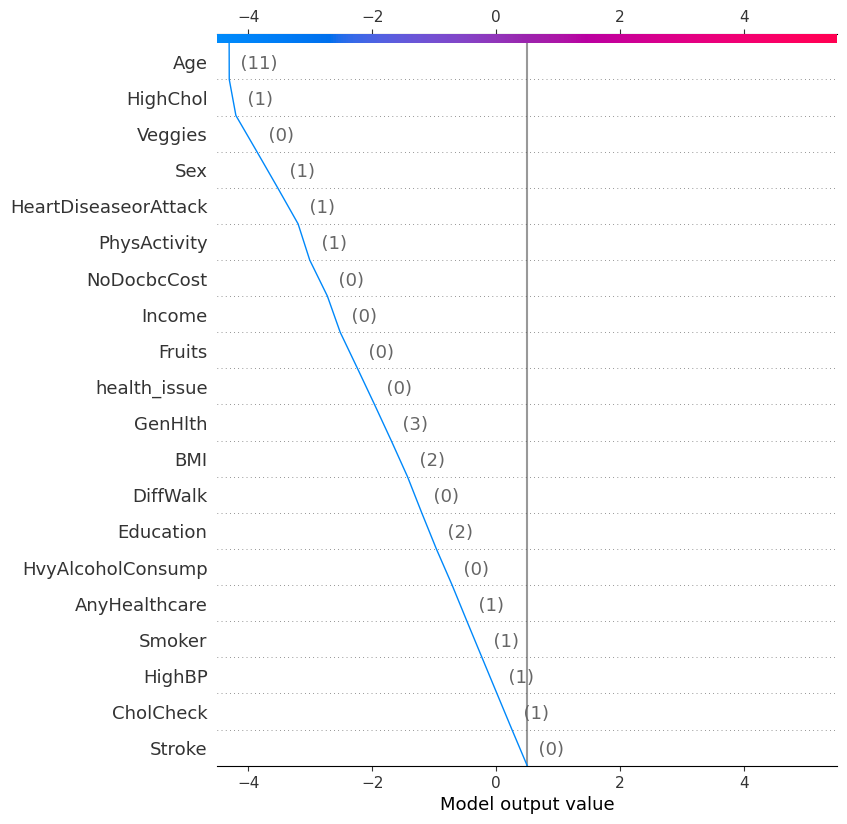

for row : 150  the real value is  0


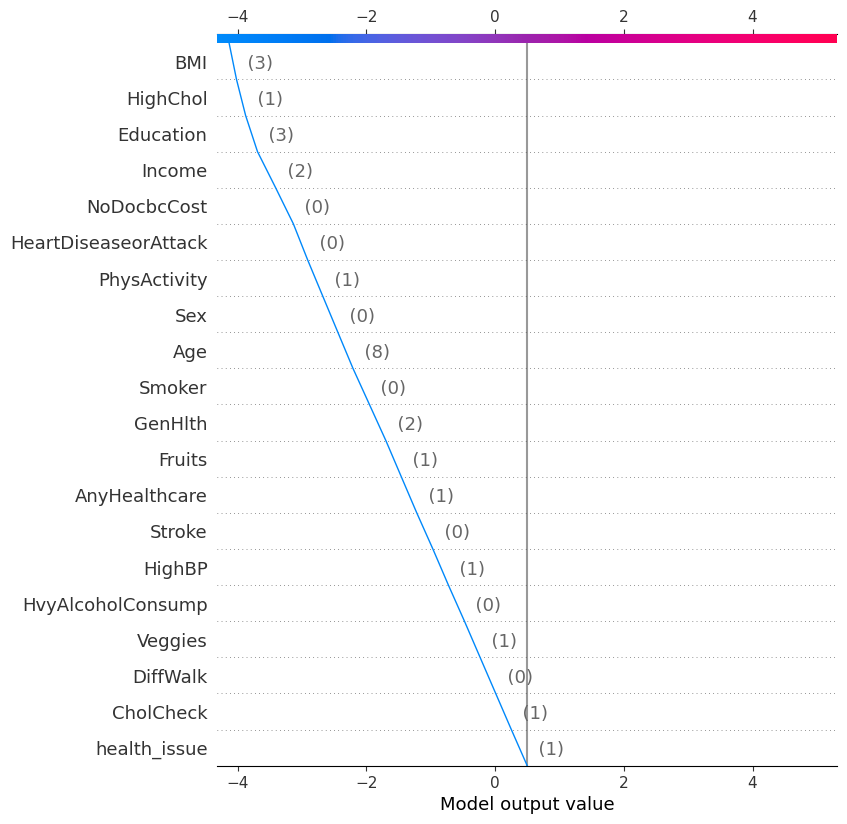

for row : 200  the real value is  0


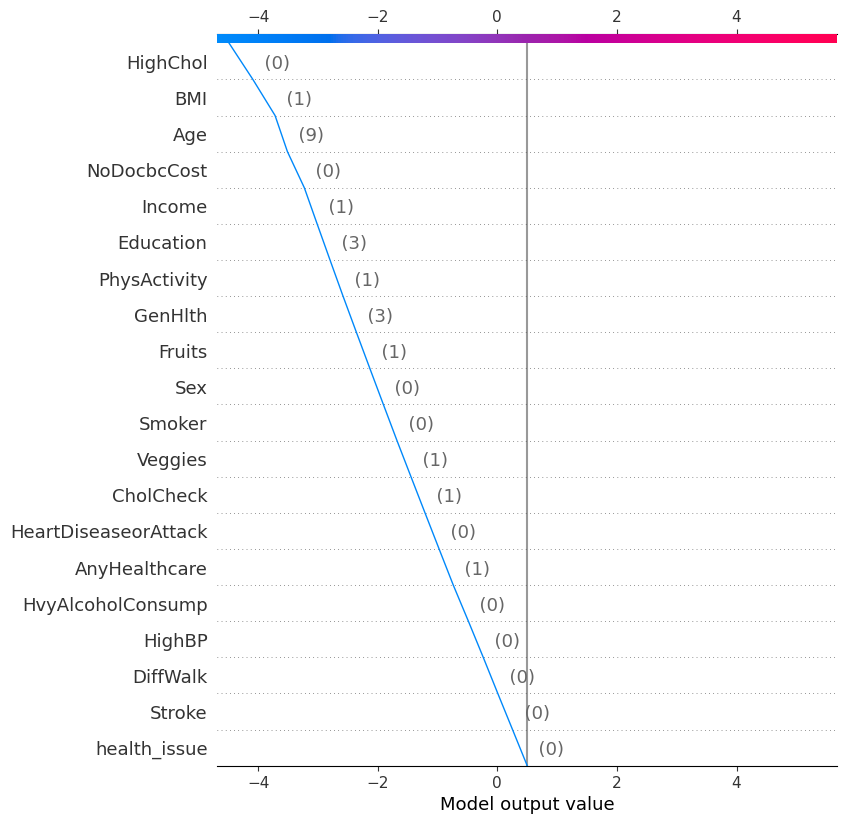

for row : 250  the real value is  0


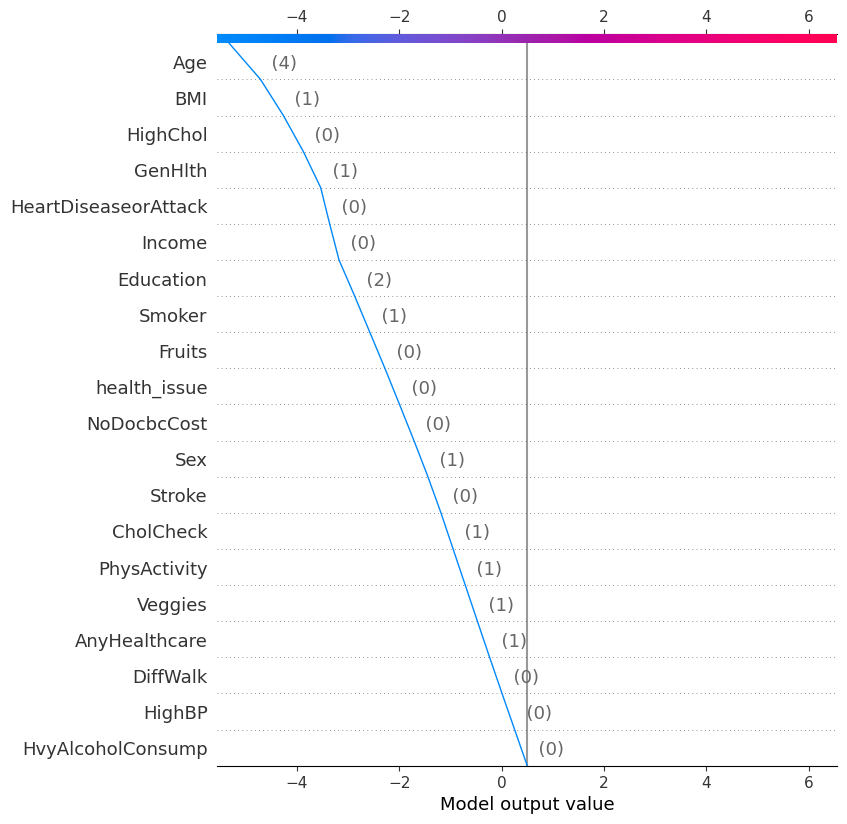

for row : 300  the real value is  2


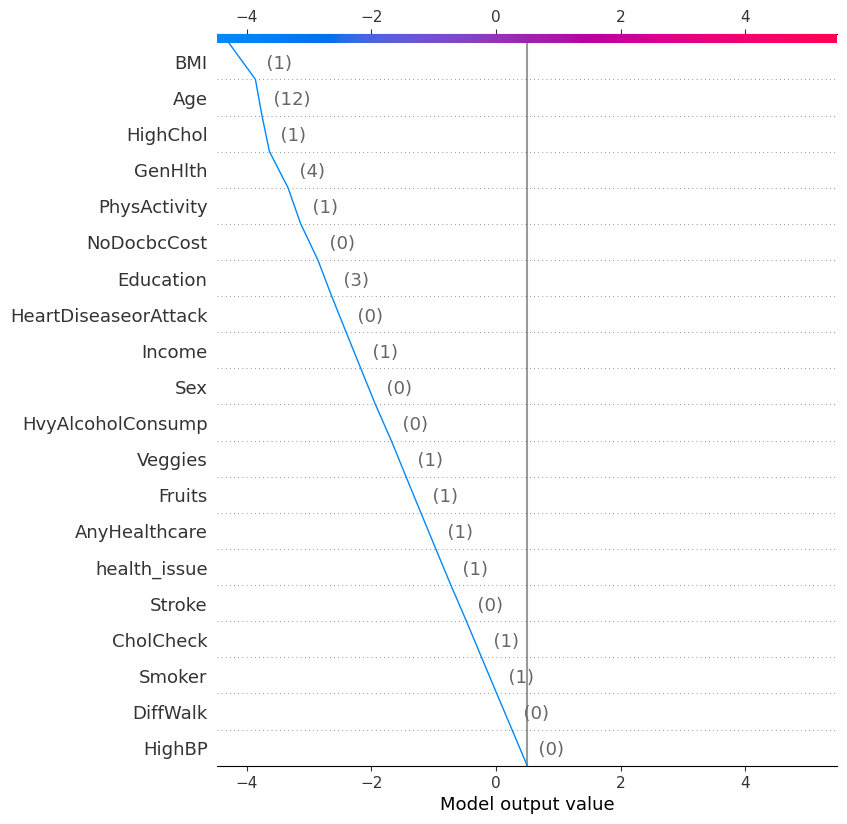

In [38]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

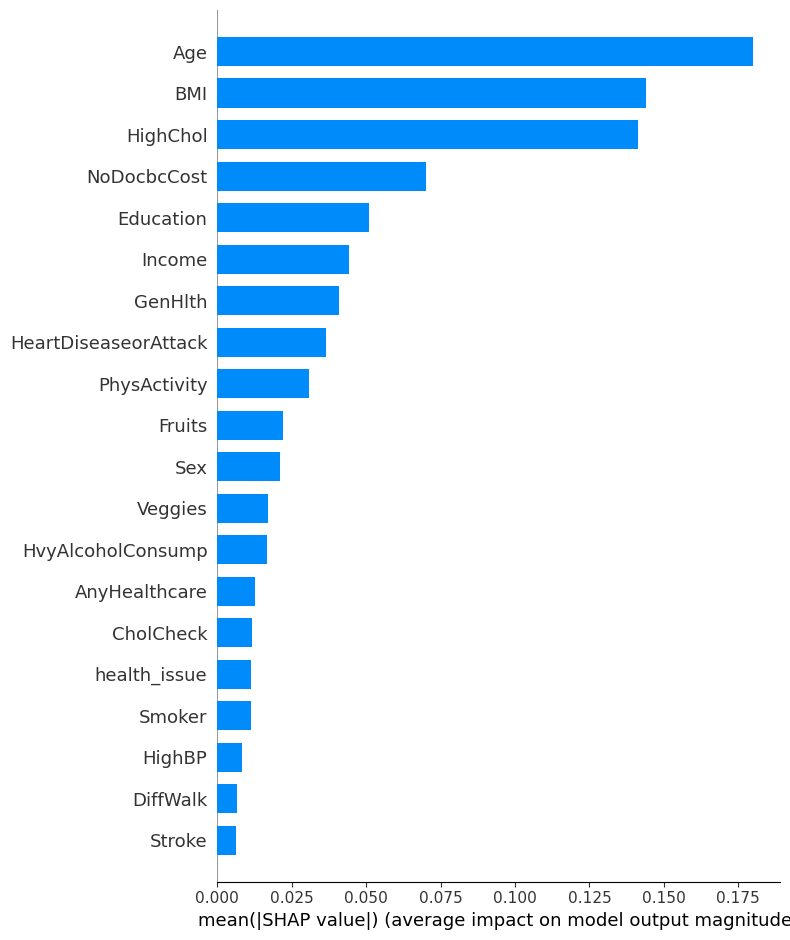

In [39]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=20, plot_type='bar')

In [40]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

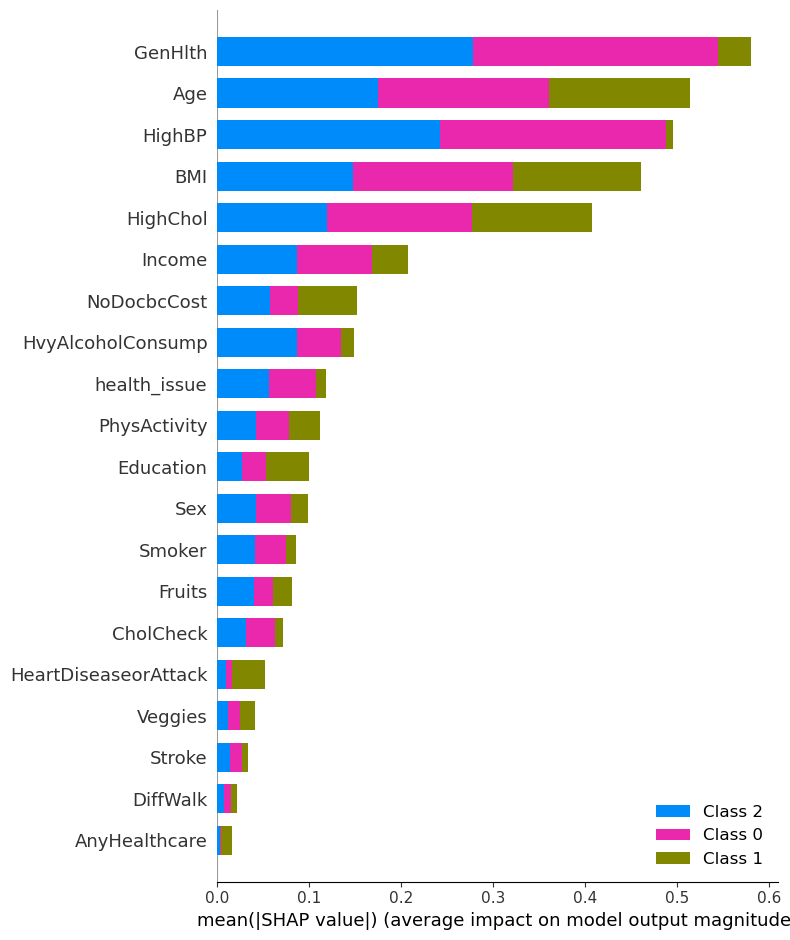

In [41]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# LIME

In [42]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2"],

)

In [43]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], lgb_model.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  0


for row : 150  the real value is  0


for row : 200  the real value is  0


for row : 250  the real value is  0


for row : 300  the real value is  2


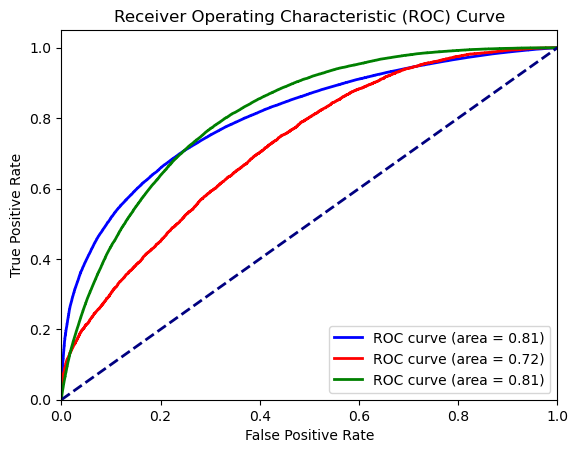

In [44]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize

# Assuming lgb_model is your model and X, y are your data and labels
# Assuming y has three classes (0, 1, and 2)

# Binarize the labels
y_bin = label_binarize(y, classes=[0, 1, 2])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], lgb_model.predict_proba(X)[:, i])
    roc_auc[i] = roc_auc_score(y_bin[:, i], lgb_model.predict_proba(X)[:, i])

# Plot ROC curve for each class
plt.figure()
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2, label='ROC curve (area = %0.2f)' % roc_auc[i])

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()
